In [1]:
from shemaFuncs import *
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
sns.set_context("talk")
# sns.set_context("paper")
sns.set(rc={'figure.figsize':(24, 24)})
import hdbscan

In [2]:
w2vDf = loadW2v()

In [3]:
print(w2vDf.columns)
print(w2vDf.word.head())



Index(['version', 'word', 'vector'], dtype='object')
0    the
1    and
2     of
3     to
4    you
Name: word, dtype: object


In [4]:
unqVersions = pd.unique(w2vDf.version)
print(unqVersions)
print(len(unqVersions))

['Tanakh: The Holy Scriptures, published by JPS'
 'The Holy Scriptures: A New Translation (JPS 1917)'
 'Jewish English Torah'
 'Modernized Tanakh - Based on JPS 1917, Edited by Adam Cohn'
 'The Rashi chumash by Rabbi Shraga Silverstein'
 'The Koren Jerusalem Bible'
 'Metsudah Chumash, Metsudah Publications, 2009'
 'Torah Yesharah, translated and edited by Chas. Kahane. New York, 1963']
8


In [5]:
pcaDecomps = []
for curVersion in unqVersions:
    print("working on version: {}".format(curVersion))
    pca = PCA(n_components=2)
    curVecs = w2vDf[ w2vDf.version == curVersion].vector.values
    curVecs = np.stack(curVecs)
    pca.fit(curVecs)
    tempDecomp = pca.transform(curVecs)
    pcaDecomps.append(tempDecomp)
pcaDecomps = np.vstack(pcaDecomps)
pcaDecomps.shape

working on version: Tanakh: The Holy Scriptures, published by JPS
working on version: The Holy Scriptures: A New Translation (JPS 1917)
working on version: Jewish English Torah
working on version: Modernized Tanakh - Based on JPS 1917, Edited by Adam Cohn
working on version: The Rashi chumash by Rabbi Shraga Silverstein
working on version: The Koren Jerusalem Bible
working on version: Metsudah Chumash, Metsudah Publications, 2009
working on version: Torah Yesharah, translated and edited by Chas. Kahane. New York, 1963


(45755, 2)

In [6]:
pcaDf = pd.DataFrame()
pcaDf['x'] = pcaDecomps[:,0]
pcaDf['y'] = pcaDecomps[:,1]
pcaDf['version'] = w2vDf.version.values

In [7]:
unique = pcaDf['version'].unique()
palette = dict(zip(unique, sns.color_palette(n_colors=len(unique))))
palette.update({"Total":"k"})
alphaParam = 1/len(pd.unique(pcaDf["version"]))

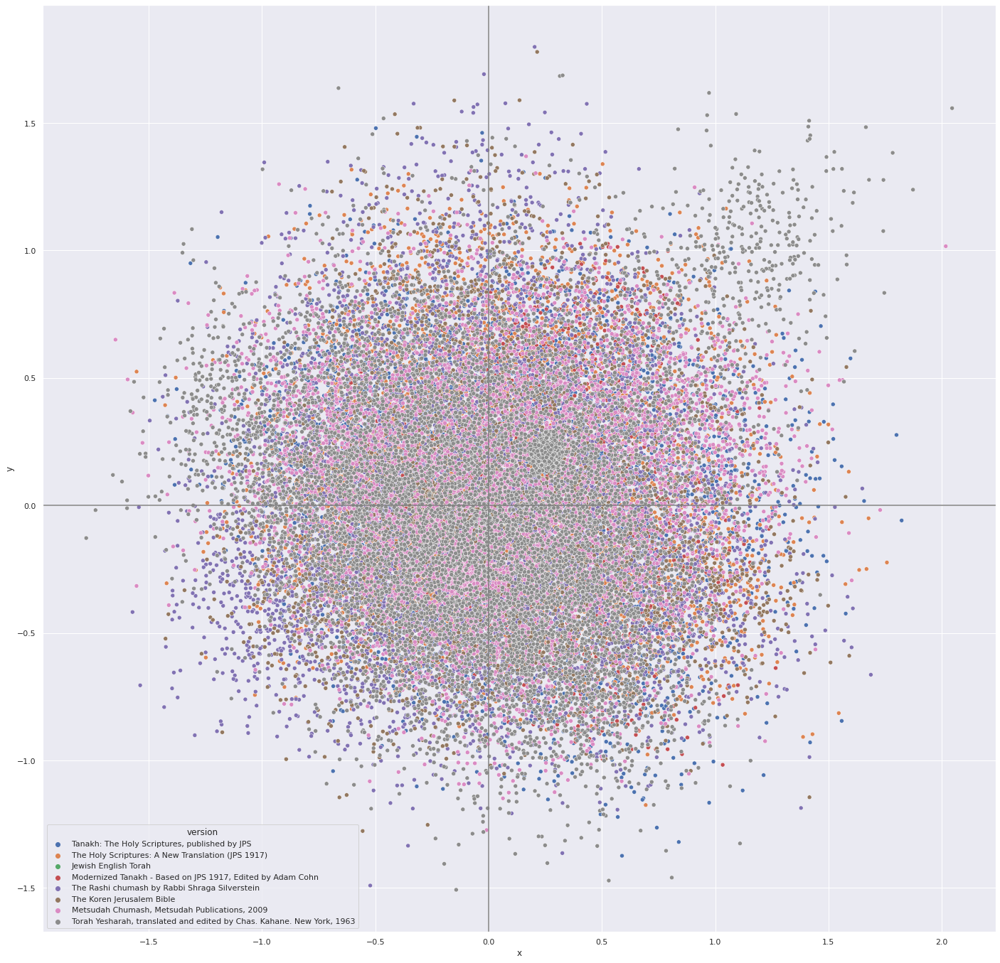

In [8]:
sns.scatterplot(data=pcaDf, x='x', 
                y='y', 
             hue='version', 
             palette=palette,
             )
plt.axhline(0, color='grey')
plt.axvline(0, color='grey')

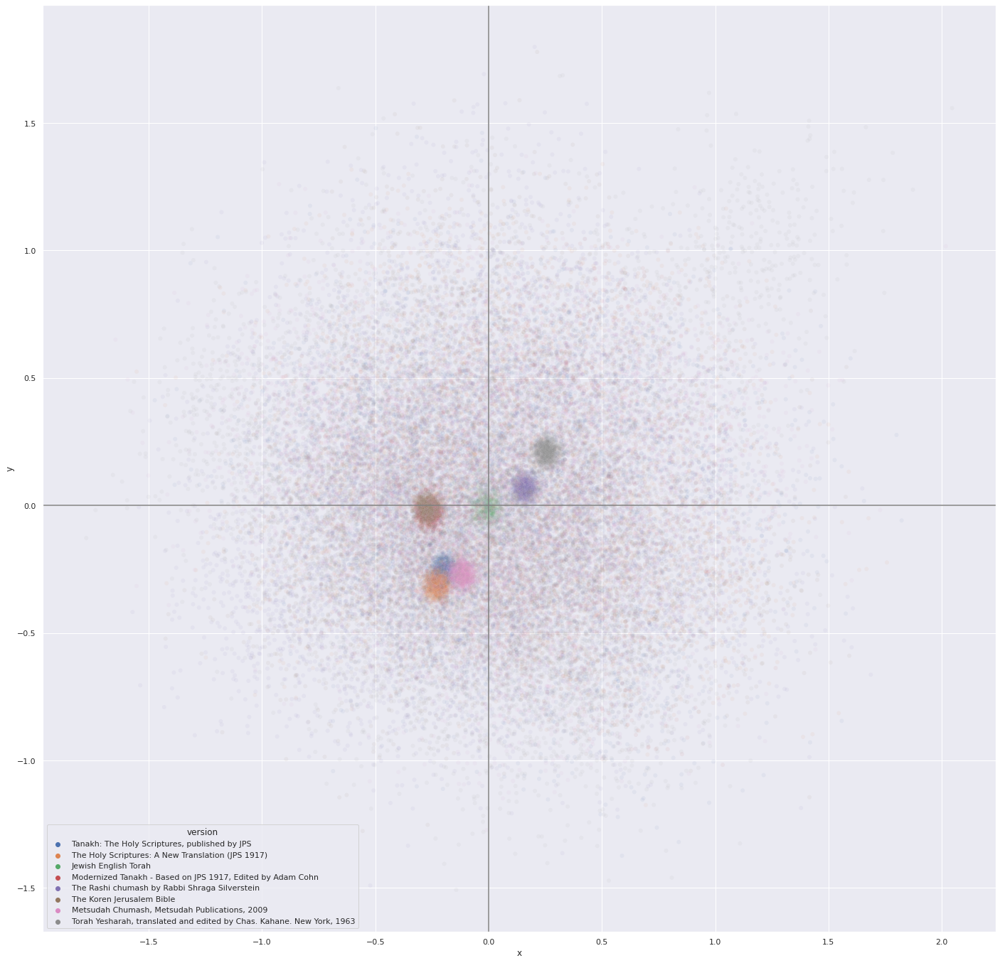

In [9]:
sns.scatterplot(data=pcaDf, x='x', 
                y='y', 
             hue='version', 
             palette=palette,
              alpha=alphaParam/2
             )
plt.axhline(0, color='grey')
plt.axvline(0, color='grey')

In [10]:
clusterer = hdbscan.HDBSCAN(min_cluster_size = 150)
clusterer = clusterer.fit(pcaDecomps)

In [11]:
pcaDf['cluster'] = clusterer.labels_

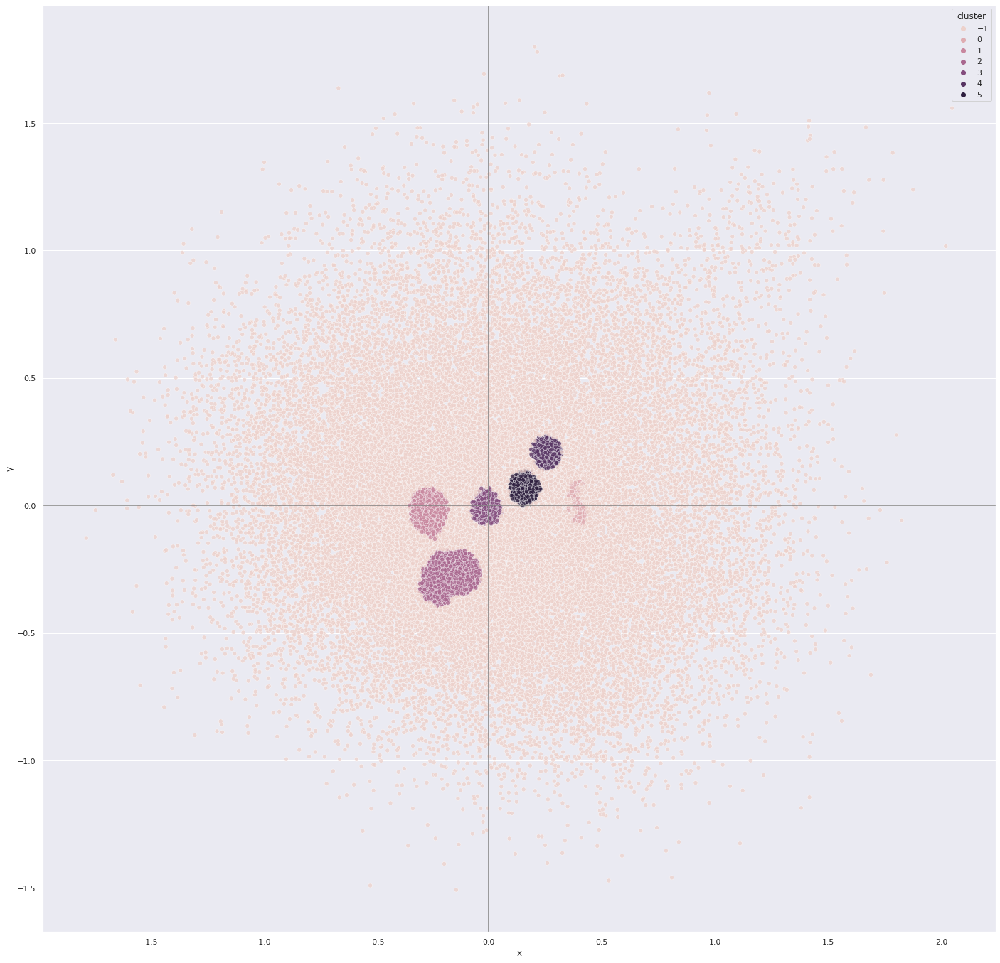

In [12]:
sns.scatterplot(data=pcaDf, x='x', y='y', 
             hue='cluster', 
              alpha=.75
             )
plt.axhline(0, color='grey')
plt.axvline(0, color='grey')

<AxesSubplot:xlabel='cluster', ylabel='Count'>

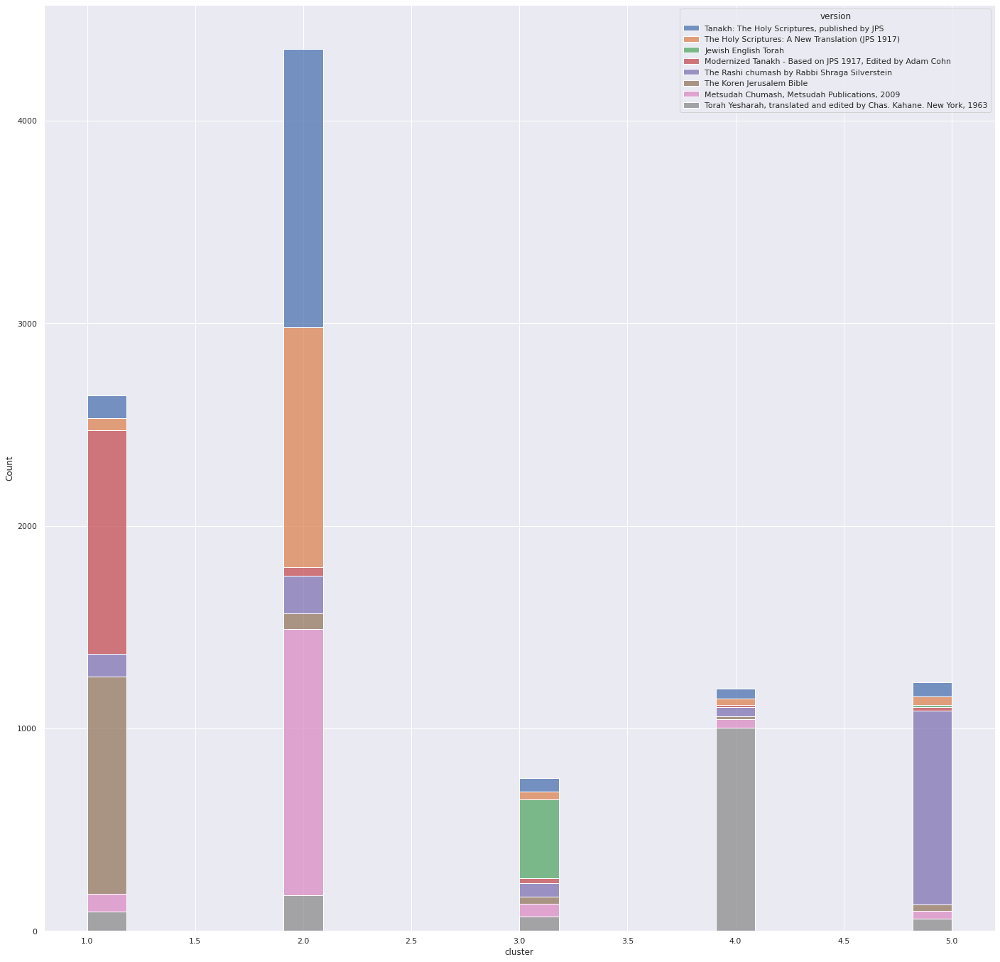

In [13]:
sns.histplot(
    data=pcaDf[ pcaDf['cluster'] > 0 ],
    x="cluster", hue="version",
    palette=palette,
    multiple="stack",
)


on cluster: 2


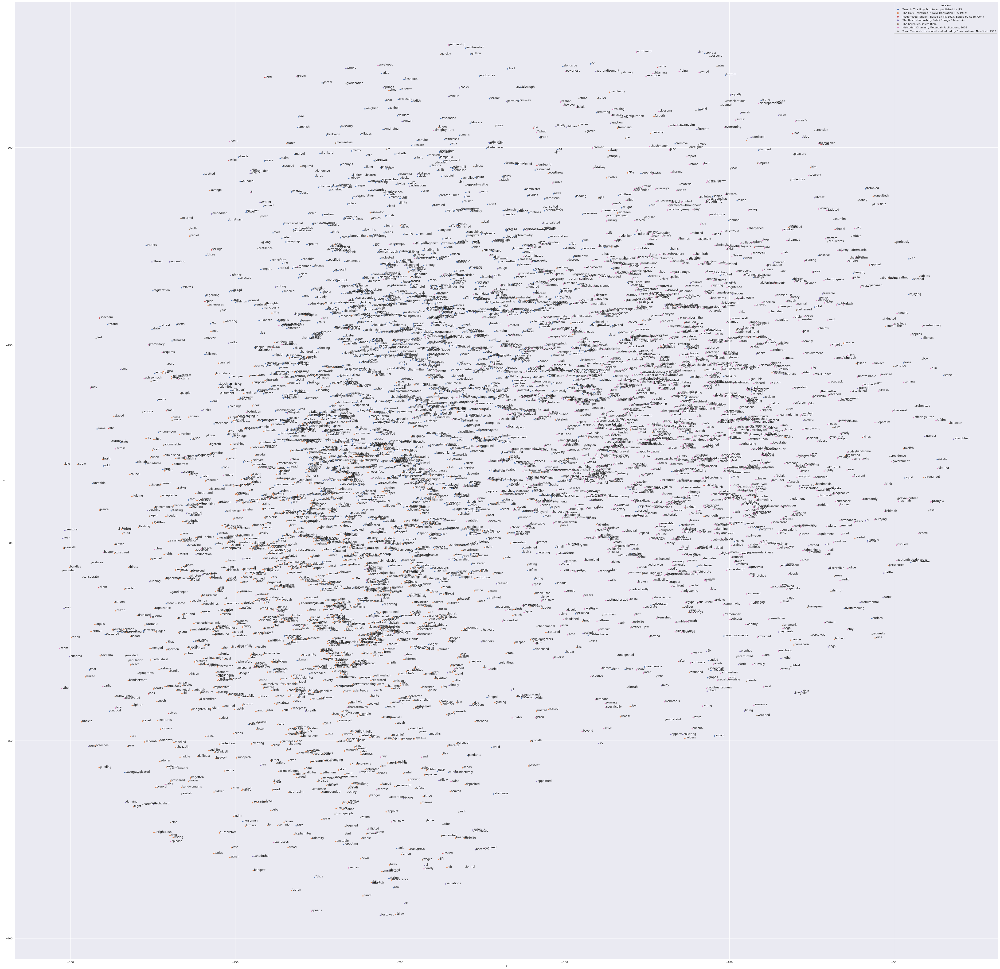


on cluster: 3


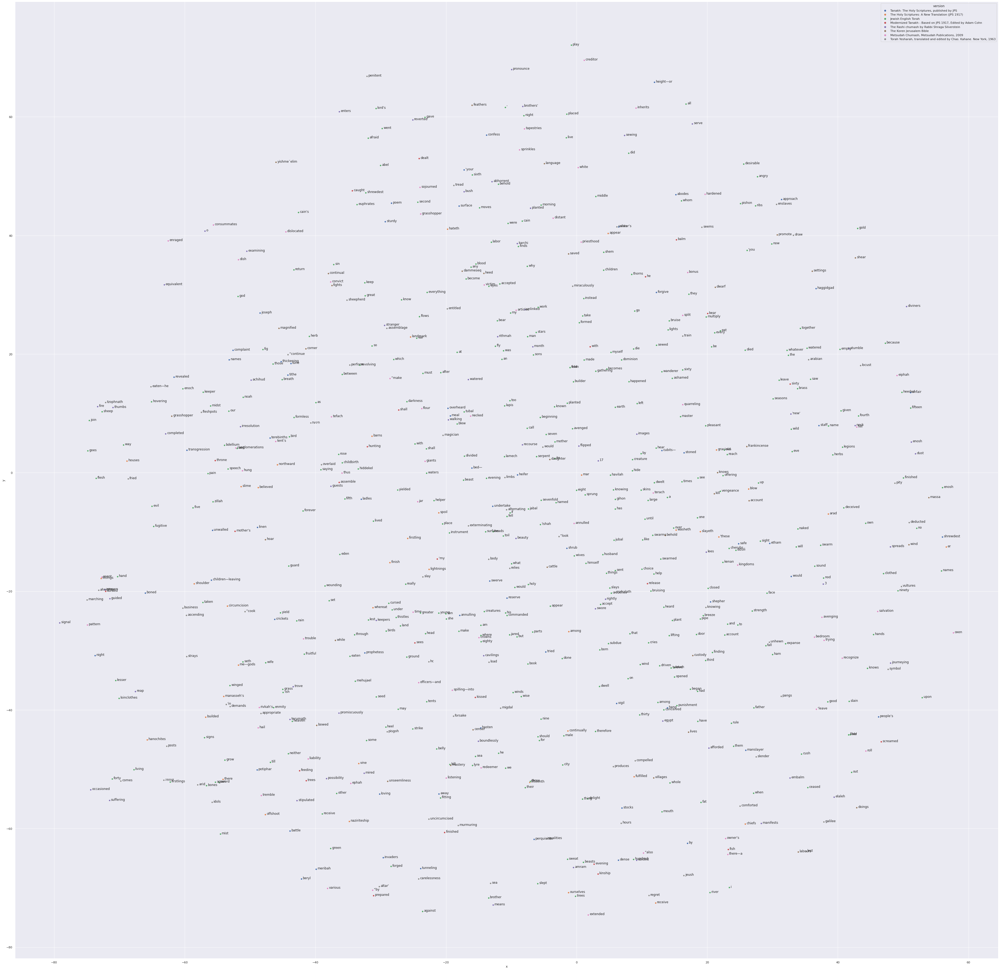


on cluster: 4


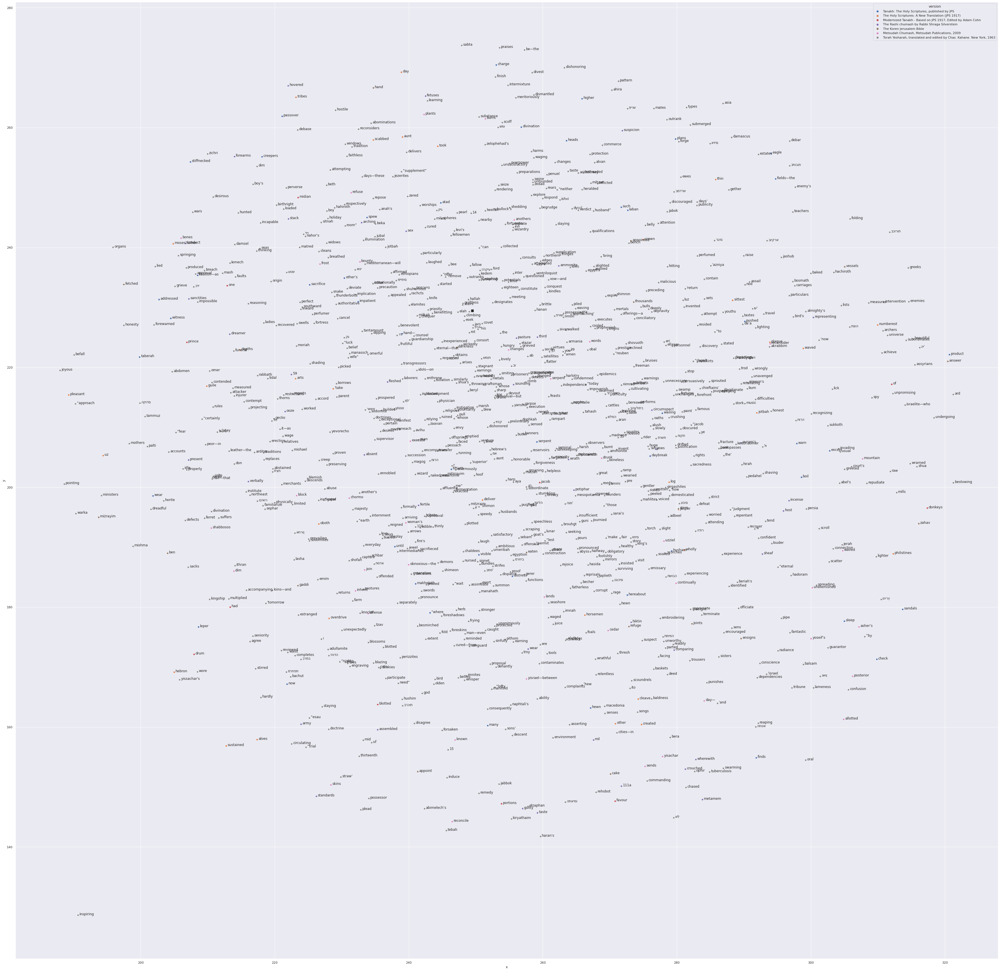


on cluster: 5


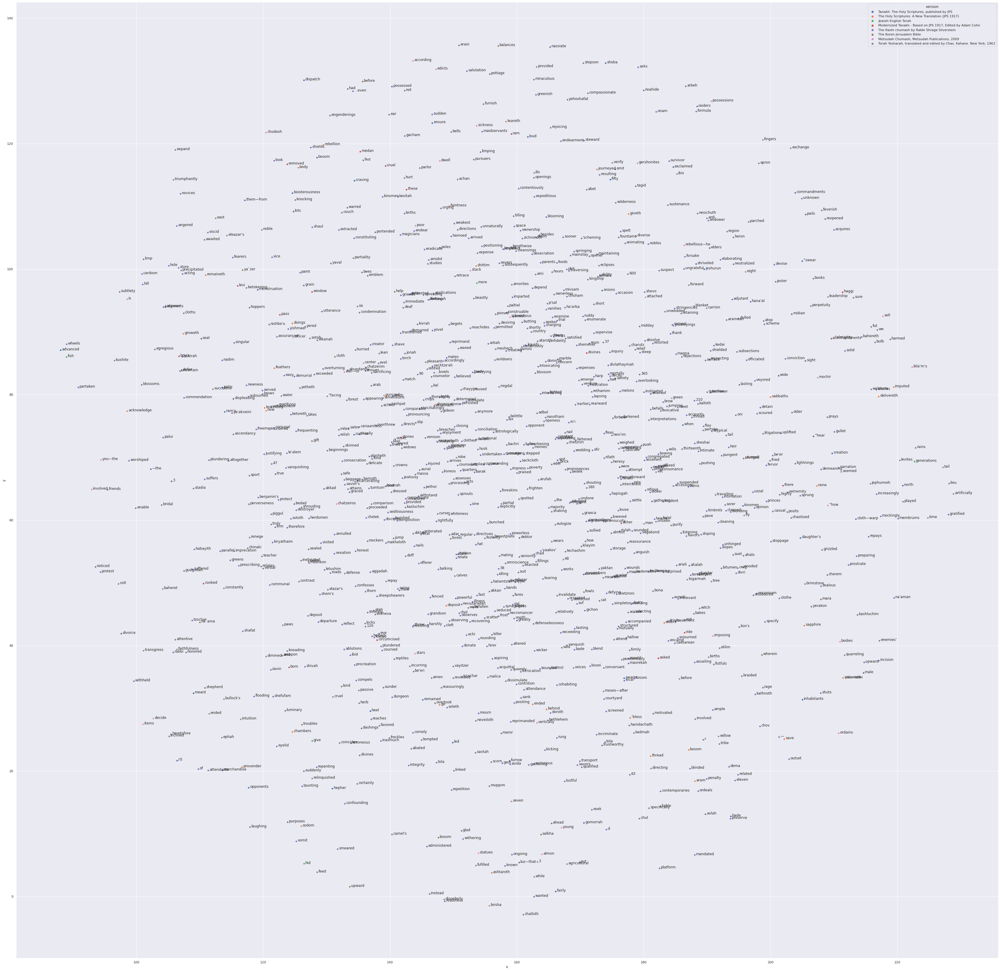

In [14]:
curSize = 100
sns.set(rc={'figure.figsize':(20, 20)})
for clus_i in range(2, pcaDf['cluster'].max()+1):
    curSize = curSize * (1-(1/clus_i)**2)
    
    sns.set(rc={'figure.figsize':(curSize, curSize)})
    tmpStr = "\non cluster: {clus_i}"
    print(tmpStr.format(clus_i=clus_i))
    df = pcaDf[ pcaDf['cluster'] == clus_i ].reset_index()
    df['word'] = w2vDf[ pcaDf['cluster'] == clus_i ].reset_index().word.values
    df['version'] = w2vDf[ pcaDf['cluster'] == clus_i ].reset_index().version.values
    df['x'] = df['x'] * 1000
    df['y'] = df['y'] * 1000
    x_center = df['x'].values.mean()
    y_center = df['y'].values.mean()
    clust_center = np.array(x_center, y_center)
    dist_from_center = np.linalg.norm((df[['x','y']].values - clust_center), axis=1)
    df['dist'] = dist_from_center
    # df = df.sort_values(['dist'])[:100].reset_index()
    sns.scatterplot(data=df, x="x", y="y", hue="version", palette=palette)
    for line in range(0,df.shape[0]):
        plt.text(df.x[line]+0.2, df.y[line], df.word[line], horizontalalignment='left')#, size='medium', color='black') #, weight='semibold')
    plt.show()